In [2]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Readme
Change dataset, crop_id, obj_id only

# 1. Crop images

In [11]:
# load sam
from src.model.sam import CustomSamAutomaticMaskGenerator, load_sam
from segment_anything.modeling.sam import Sam

def move_to_device(segmentor_model, device="cuda"):
    # if there is predictor in the model, move it to device
    if hasattr(segmentor_model, "predictor"):
        segmentor_model.predictor.model = (
            segmentor_model.predictor.model.to(device)
        )
    else:
        segmentor_model.model.setup_model(device=device, verbose=True)
        
model_type = "vit_h"
checkpoint_dir =  "datasets/bop23_challenge/pretrained/segment-anything"
sam_model = load_sam(model_type, checkpoint_dir)
custom_sam_model = CustomSamAutomaticMaskGenerator(sam=sam_model) #, crop_overlap_ratio = 750 / 1500) # , box_nms_thresh = 0.6 )
move_to_device(custom_sam_model)

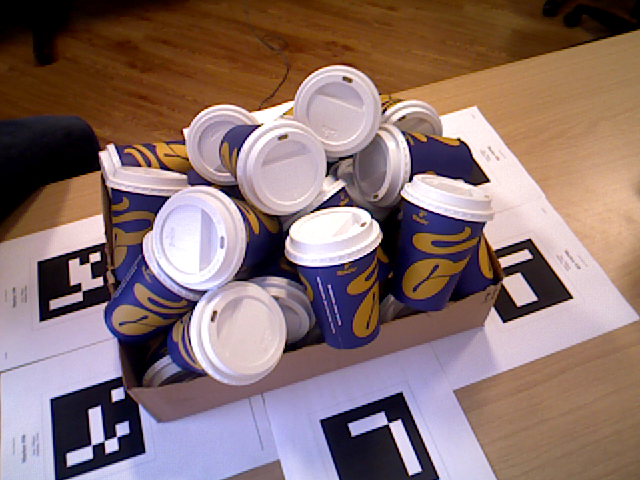

In [35]:
from PIL import Image
import torch
import numpy as np
from src.model.utils import Detections

dataset = "icbin"
rgb_path = "datasets/bop23_challenge/datasets/icbin/test/000001/rgb/000012.png" # f"datasets/bop23_challenge/datasets/{dataset}/test/000048/rgb/000001.png"
rgb = Image.open(rgb_path).convert("RGB")
sam_detections = custom_sam_model.generate_masks(np.array(rgb))
rgb

In [36]:
import torchvision.transforms as T
from src.utils.bbox_utils import CropResizePad


def _process_rgb_proposals(image_np, masks, boxes):
    """
    1. Normalize image with DINOv2 transfom
    2. Mask and crop each proposals
    3. Resize each proposals to predefined longest image size
    """
    proposal_size=224
    rgb_proposal_processor = CropResizePad(proposal_size)
    rgb_normalize = T.Compose(
            [
                T.ToTensor(),
                # T.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
            ]
        )
    num_proposals = len(masks) # masks shape 55, 480, 640]
    rgb = rgb_normalize(image_np).to(masks.device).float() # nomralize the image - 3,480, 640
    rgbs = rgb.unsqueeze(0).repeat(num_proposals, 1, 1, 1) # 55, 3, 480, 640
    masked_rgbs = rgbs * masks.unsqueeze(1)
    processed_masked_rgbs = rgb_proposal_processor(
        masked_rgbs, boxes
    )  # [N, 3, target_size, target_size]
    return processed_masked_rgbs

processed_masked_rgbs = _process_rgb_proposals(np.array(rgb), sam_detections["masks"], sam_detections["boxes"])

In [37]:
# import matplotlib.pyplot as plt
# from math import ceil
# def plot_images(images, rows, cols):
#     fig, axes = plt.subplots(rows, cols, figsize=(20, 30))
#     for i, ax in enumerate(axes.flat):
#         if i >= len(images):
#             break
#         ax.imshow(images[i].permute(1,2,0))
#         ax.axis('off')
#     plt.tight_layout()
#     plt.show()

# # Define the number of rows and columns in the grid
# rows = ceil(len(processed_masked_rgbs) / 6)
# cols = 6
# # Plot the masked_images array in a grid
# plot_images(processed_masked_rgbs.cpu(), rows, cols) 

In [38]:
from torchvision.ops.boxes import batched_nms, box_area
import cv2
import numpy as np


def tighten_bboxes(sam_detections, device="cuda"):
    # Apply morphological opening - it does eorion then dilation to remove noise
    kernel = np.ones((5,5), np.uint8)

    filtered_masks = list()
    for mask in sam_detections["masks"].cpu():
        filtered_mask = cv2.morphologyEx(np.array(mask, dtype="uint8"), cv2.MORPH_OPEN, kernel)
        filtered_masks.append(torch.tensor(filtered_mask))
    sam_detections["masks"] = torch.stack(filtered_masks).to(device)
    return sam_detections


def _remove_very_small_detections(masks, boxes): # after this step only valid boxes, masks are saved, other are filtered out
    min_box_size = 0.05 # relative to image size 
    min_mask_size = 300/(640*480) # relative to image size assume the pixesl should be in range (300, 10000) need to remove them 
    max_mask_size = 10000/(640*480) 
    img_area = masks.shape[1] * masks.shape[2]
    box_areas = box_area(boxes) / img_area
    formatted_values = [f'{value.item():.6f}' for value in box_areas*img_area]
    mask_areas = masks.sum(dim=(1, 2)) / img_area
    keep_idxs = torch.logical_and(
        torch.logical_and(mask_areas > min_mask_size, mask_areas < max_mask_size),
        box_areas > min_box_size**2
    )

    return keep_idxs

noise_remove_sam_detections = tighten_bboxes(sam_detections)
keep_ids = _remove_very_small_detections(noise_remove_sam_detections["masks"], noise_remove_sam_detections["boxes"]) # torch.arange(len(noise_remove_sam_detections["masks"])) # 
selected_masks = [noise_remove_sam_detections["masks"][i] for i in range(len(keep_ids)) if keep_ids[i]]
selected_bboxes = [noise_remove_sam_detections["boxes"][i] for i in range(len(keep_ids)) if keep_ids[i]]

# noise_remove_sam_detections = sam_detections
# keep_ids = torch.arange(0, len(noise_remove_sam_detections["masks"]))#  _remove_very_small_detections(noise_remove_sam_detections["masks"], noise_remove_sam_detections["boxes"]) # torch.arange(len(noise_remove_sam_detections["masks"])) # 
# selected_masks = [noise_remove_sam_detections["masks"][i] for i in range(len(keep_ids))]
# selected_bboxes = [noise_remove_sam_detections["boxes"][i] for i in range(len(keep_ids))]

selected_sam_detections = {
    "masks" : torch.stack(selected_masks),
    "boxes" : torch.stack(selected_bboxes)
}

print(len(selected_sam_detections["masks"]))
print(len(sam_detections["masks"]))

72
107


In [39]:
def extract_object_by_mask(image, mask, width: int = 512):
    mask = Image.fromarray(mask)
    masked_image = Image.composite(
        image, Image.new("RGB", image.size, (0, 0, 0)), mask)
    cropped_image = masked_image.crop(masked_image.getbbox())
    # new_height = width * cropped_image.height // cropped_image.width
    return cropped_image

masked_images = []
for mask in selected_sam_detections["masks"].cpu():
    binary_mask = np.array(mask) * 255
    binary_mask = binary_mask.astype(np.uint8)
    masked_image = extract_object_by_mask(rgb, binary_mask)
    masked_images.append(masked_image)

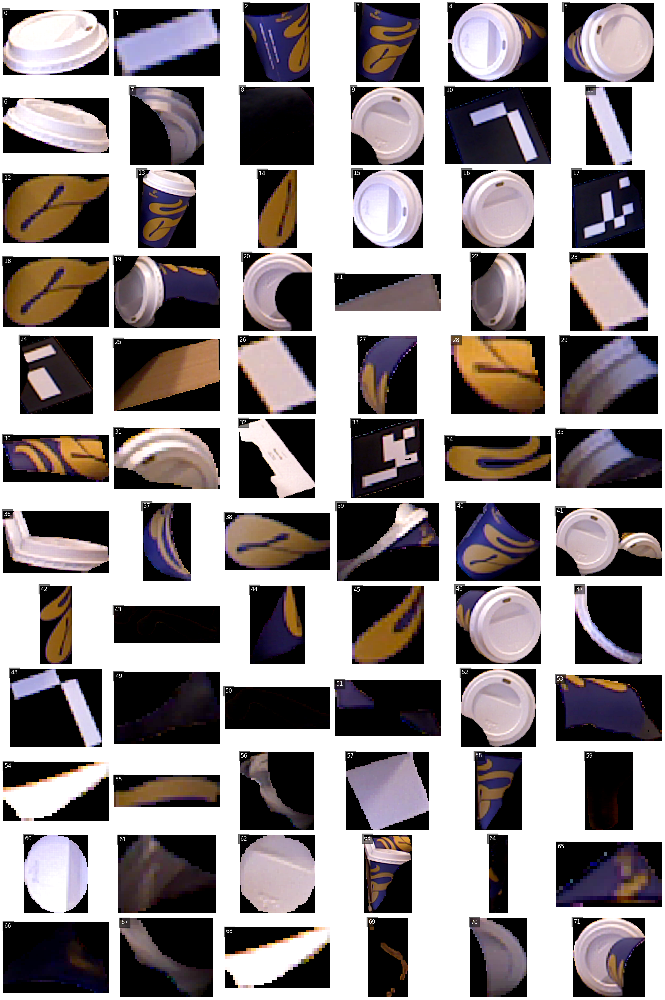

In [40]:
import matplotlib.pyplot as plt
from math import ceil

def plot_images(images, rows, cols):
    fig, axes = plt.subplots(rows, cols, figsize=(20, 30))
    for i, ax in enumerate(axes.flat):
        if i >= len(images):
            break
        ax.imshow(images[i])
        ax.axis('off')
        # Add index at the top left corner of each subplot
        ax.text(0, 0, f'{i}', color='white', fontsize=12, ha='left', va='top',
                bbox=dict(facecolor='black', alpha=0.5))
    plt.tight_layout()
    plt.show()

# Define the number of rows and columns in the grid
rows = ceil(len(masked_images) / 6)
cols = 6

# Plot the masked_images array in a grid with indices
plot_images(masked_images, rows, cols)

In [41]:
y = x+12'

SyntaxError: EOL while scanning string literal (1135641024.py, line 1)

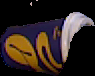

In [23]:
import os

# Choose crop 4 it is in object id 12
crop_idx = 61 # 125, 102 for background; 131 for foreground
obj_id = 1
crop1 = {
    "crop" : masked_images[crop_idx], # it is saved as Image so crop1["crop"] to visualize it
    "masks" : sam_detections["masks"][crop_idx],
    "boxes" : sam_detections["boxes"][crop_idx]
}

# Save image
if not os.path.exists(f"foundpose_analysis/{dataset}"):
    os.makedirs(f"foundpose_analysis/{dataset}")
crop1["crop"].save(f"foundpose_analysis/{dataset}/crop1.png")
crop1["crop"]

# 2. Templates

## 2.1 Create templates of object

In [25]:
# load config file
import hydra
from omegaconf import DictConfig, OmegaConf
from hydra import initialize, compose

# Initialize Hydra and compose the configuration
# initialize(config_path="configs")
cfg = compose(config_name="run_inference")
OmegaConf.set_struct(cfg, False)

In [26]:
import os
import glob

default_ref_dataloader_config = cfg.data.reference_dataloader
ref_dataloader_config = default_ref_dataloader_config.copy()
ref_dataloader_config._target_ = "src.dataloader.bop_pbr.BOPTemplatePBR"
ref_dataloader_config.root_dir = f"datasets/bop23_challenge/datasets/{dataset}"
ref_dataloader_config.template_dir = " "

level_template = 1 # Level 0 :42 templates, level 1, 162 templates
ref_dataloader_config.level_templates = level_template 
ref_dataloader_config.split = "train_pbr" # train_pbr

ply_files = glob.glob(f"datasets/bop23_challenge/datasets/{dataset}/models/models/*.ply")
obj_ids = sorted([int(os.path.basename(obj_id)[8:10]) for obj_id in ply_files])
ref_dataloader_config.obj_ids = obj_ids

out_folder = f"foundpose_analysis/{dataset}/templates"
if not os.path.exists(out_folder):
    os.makedirs(out_folder)
ref_dataloader_config.out_dir = out_folder
ref_dataloader_config.templates_output_folder = f"{out_folder}/level_template_{level_template}"

## 2.2. Templates features extraction

In [27]:
import glob
import os

obj_id_2 = 2
syn_data_type = "train_pbr" # test

# Load original templates when before putting through dinov2 we also apply transformation.
syn_template_path_1 = f"{out_folder}/{syn_data_type}_images_templates/obj_{obj_id:06d}_original" 
syn_template_path_2 = f"{out_folder}/{syn_data_type}_images_templates/obj_{obj_id_2:06d}_original" 
syn_template_files_1 = sorted(glob.glob(os.path.join(syn_template_path_1, "*.png")), key=os.path.getmtime)
syn_template_files_2 = sorted(glob.glob(os.path.join(syn_template_path_2, "*.png")), key=os.path.getmtime)
syn_template_files = syn_template_files_1 # + syn_template_files_2
syn_num_templates = len(syn_template_files)
syn_num_templates

162

In [28]:
from PIL import Image
import numpy as np


# [50:450, 150:500, :3] only for pyrender template not for BlenderProc templates
syn_templates = [np.array(Image.open(template_file).convert("RGB"))[:,:,:3]/255.0 for template_file in syn_template_files] # This image has 4 channels- the last one is not crucial - maybe about opacity

# 3. Compare using trained model

## 3.1 Use Clssification Model

In [29]:
from src.model.custom_cnos import check_similarity, check_similarity_2


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
best_model_path = "contrastive_learning/saved_checkpoints/best_model_checkpoint.pth"
crop_path = "foundpose_analysis/icbin/crop1.png"
crop_rgb = np.transpose(np.array(Image.open(crop_path).convert("RGB"))[:,:,:3]/255.0, (2,0,1)) # (124, 157, 3)

# Test model
check_similarity_2(best_model_path=best_model_path, crop_rgb=crop_rgb, templates=syn_templates, device=device)
# see the results lb it is quite inconsitent- it means we lack data augmentation and also the dataset needs to be expanded for more cases for postive pairs

Using cache found in /home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main
/home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:43: UserWarning: xFormers is available (SwiGLU)
  warnings.warn("xFormers is available (SwiGLU)")
/home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:27: UserWarning: xFormers is available (Attention)
  warnings.warn("xFormers is available (Attention)")
/home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:33: UserWarning: xFormers is available (Block)
  warnings.warn("xFormers is available (Block)")


KeyboardInterrupt: 

In [25]:
from src.model.custom_cnos import check_similarity_3
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
best_model_path = "contrastive_learning/saved_checkpoints/best_model_checkpoint.pth"
aggreation_num_templates = 5
average_indices, max_indices, min_indices, average_prob, max_prob, min_prob, average_outputs_test, outputs_test = check_similarity_3(best_model_path=best_model_path, masked_images=masked_images, templates=syn_templates, aggreation_num_templates = aggreation_num_templates, device=device)
# see the results lb it is quite inconsitent- it means we lack data augmentation and also the dataset needs to be expanded for more cases for postive pairs

Using cache found in /home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main


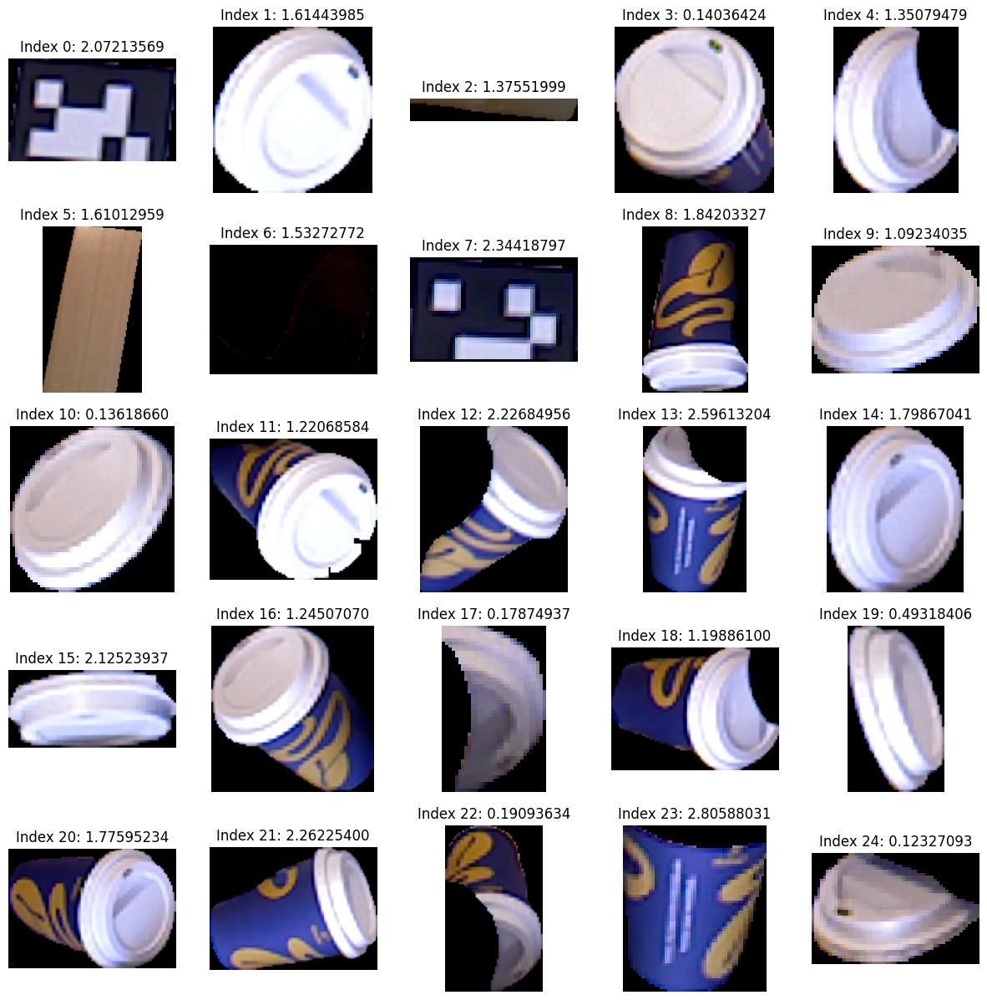

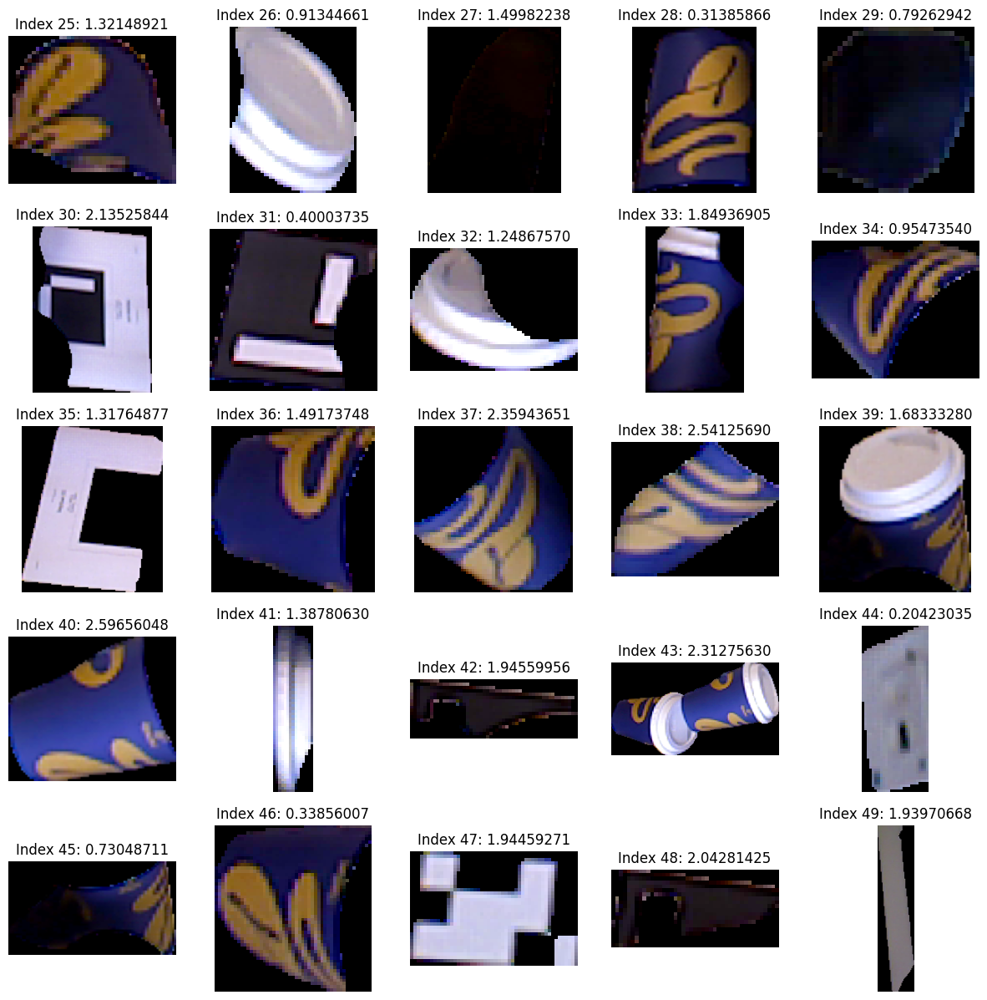

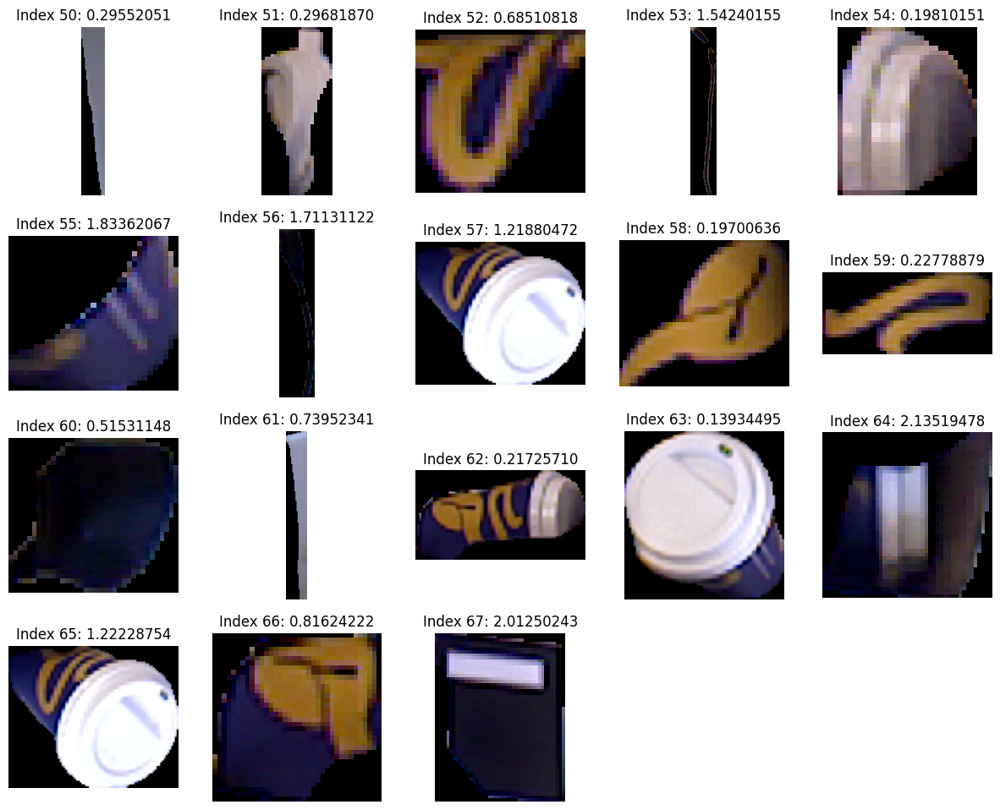

In [32]:
import matplotlib.pyplot as plt
import numpy as np

idx_selected_proposals = torch.arange(len(masked_images)) #a
pred_probs = average_outputs_test
# Number of images to display at a time
images_per_page = 25

# Define the number of rows and columns for the grid
rows = 5
cols = 5

# Iterate over the indices in idx_selected_proposals in steps of images_per_page
for i in range(0, len(idx_selected_proposals), images_per_page):
    # Create a new figure for each set of images
    plt.figure(figsize=(15, 15))

    for j in range(images_per_page):
        # Calculate the current index in idx_selected_proposals
        current_index = i + j

        # Check if the current index is within the bounds of idx_selected_proposals
        if current_index >= len(idx_selected_proposals):
            break

        # Get the image index from idx_selected_proposals
        image_index = idx_selected_proposals[current_index]
        image_prob = format(float(pred_probs[current_index].item()),".8f")

        # Add a subplot for the current image
        plt.subplot(rows, cols, j + 1)
        plt.imshow(np.array(masked_images[image_index]))
        plt.title(f"Index {image_index}: {image_prob}")
        plt.axis('off')

    # Display the figure containing the images
    plt.show()

In [20]:
# import matplotlib.pyplot as plt
# import numpy as np

# idx_selected_proposals = average_indices # torch.arange(len(masked_images)) #a
# pred_probs = average_prob
# # Number of images to display at a time
# images_per_page = 25

# # Define the number of rows and columns for the grid
# rows = 5
# cols = 5

# # Iterate over the indices in idx_selected_proposals in steps of images_per_page
# for i in range(0, len(idx_selected_proposals), images_per_page):
#     # Create a new figure for each set of images
#     plt.figure(figsize=(15, 15))

#     for j in range(images_per_page):
#         # Calculate the current index in idx_selected_proposals
#         current_index = i + j

#         # Check if the current index is within the bounds of idx_selected_proposals
#         if current_index >= len(idx_selected_proposals):
#             break

#         # Get the image index from idx_selected_proposals
#         image_index = idx_selected_proposals[current_index]
#         image_prob = format(float(pred_probs[current_index].item()),".8f")

#         # Add a subplot for the current image
#         plt.subplot(rows, cols, j + 1)
#         plt.imshow(np.array(masked_images[image_index]))
#         plt.title(f"Index {image_index}: {image_prob}")
#         plt.axis('off')

#     # Display the figure containing the images
#     plt.show()

In [22]:
len(max_indices)

24

In [32]:
# results = np.load(file_path+".npz")

In [33]:
# t = np.load("contrastive_learning/outputs/test_xoa.npz")
# t["segmentation"].astype(bool)

In [34]:
# results["segmentation"]

File contrastive_learning/outputs/train_pbr.json does not exist.
File contrastive_learning/outputs/train_pbr.npz does not exist.


100%|██████████| 25/25 [00:08<00:00,  2.82it/s]


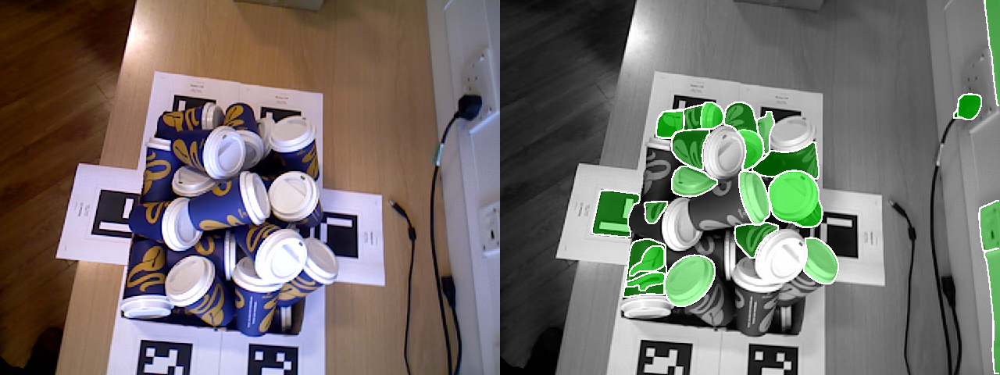

In [19]:
from src.model.custom_cnos import custom_detections, custom_visualize, custom_detections_2, custom_visualize_2

scene_id = 1
image_id = 1
dataset_name = "icbin"
real_data_type = "train_pbr"
# rgb_path = 'datasets/bop23_challenge/datasets/icbin/train_pbr/000001/rgb/000000.jpg'
file_path = f"contrastive_learning/outputs/{real_data_type}"
custom_detections_2(selected_sam_detections, idx_selected_proposals, file_path, scene_id=1, frame_id=1)

results = np.load(file_path+".npz")
dets = []
for i in range(results["segmentation"].shape[0]):
    det = {
    "scene_id": results["scene_id"],
    "image_id": results["image_id"],
    "category_id": results["category_id"][i],
    "bbox": results["bbox"][i],
    "segmentation": results["segmentation"][i].astype(bool),
    }
    dets.append(det)

final_result = custom_visualize_2(dataset_name, rgb_path, dets)
final_result
# see the results lb- lots of white crops are confused and clssified as objects

In [36]:
len(masked_imaes)

NameError: name 'masked_imaes' is not defined

# 4. Final Test for All Test Images

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
# load sam
from src.model.sam import CustomSamAutomaticMaskGenerator, load_sam
from segment_anything.modeling.sam import Sam

def move_to_device(segmentor_model, device="cuda"):
    # if there is predictor in the model, move it to device
    if hasattr(segmentor_model, "predictor"):
        segmentor_model.predictor.model = (
            segmentor_model.predictor.model.to(device)
        )
    else:
        segmentor_model.model.setup_model(device=device, verbose=True)
        
model_type = "vit_h"
checkpoint_dir =  "datasets/bop23_challenge/pretrained/segment-anything"
sam_model = load_sam(model_type, checkpoint_dir)
custom_sam_model = CustomSamAutomaticMaskGenerator(sam=sam_model) #, crop_overlap_ratio = 750 / 1500) # , box_nms_thresh = 0.6 )
move_to_device(custom_sam_model)

In [1]:
# import glob
# from tqdm import trange
# from src.model.custom_cnos import full_pipeline, full_pipeline_non_filtered

# dataset = "hudiebanjin"
# test_scene_id = 0
# obj_id = 1
# rgb_paths = sorted(glob.glob(f"datasets/bop23_challenge/datasets/{dataset}/test/{test_scene_id:06d}/rgb/*.png"))
# best_model_path = "contrastive_learning/saved_checkpoints/hudiebanjin_best_model_checkpoint.pth"

# for i in trange(0,len(rgb_paths)):
# # for i in trange(10,11):
# # for rgb_path in rgb_paths:
#     scene_id = int(rgb_paths[i].split("/")[-3])
#     frame_id = int(rgb_paths[i].split("/")[-1].split(".")[0])
#     full_pipeline(custom_sam_model= custom_sam_model, rgb_path=rgb_paths[i], scene_id=scene_id, frame_id=frame_id, best_model_path=best_model_path, obj_id=obj_id, dataset=dataset, aggreation_num_templates=5)


In [20]:
# icbin
import glob
from tqdm import trange
from src.model.custom_cnos import full_pipeline, full_pipeline_non_filtered

dataset = "icbin"
test_scene_id = 1
obj_id = 1
rgb_paths = sorted(glob.glob(f"datasets/bop23_challenge/datasets/{dataset}/test/{test_scene_id:06d}/rgb/*.png"))
best_model_path = "contrastive_learning/saved_checkpoints/icbinbest_model_checkpoint.pth"

for i in trange(0,len(rgb_paths)):
# for i in trange(10,11):
# for rgb_path in rgb_paths:
    scene_id = int(rgb_paths[i].split("/")[-3])
    frame_id = int(rgb_paths[i].split("/")[-1].split(".")[0])
    full_pipeline(custom_sam_model= custom_sam_model, rgb_path=rgb_paths[i], scene_id=scene_id, frame_id=frame_id, best_model_path=best_model_path, obj_id=obj_id, dataset=dataset, aggreation_num_templates=5)


  0%|          | 0/56 [00:00<?, ?it/s]Using cache found in /home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main


File contrastive_learning/output_npz/000001_000000_contrastive.json does not exist.
File contrastive_learning/output_npz/000001_000000_contrastive.npz has been deleted.


  2%|▏         | 1/56 [00:22<20:46, 22.67s/it]Using cache found in /home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main


File contrastive_learning/output_npz/000001_000001_contrastive.json does not exist.
File contrastive_learning/output_npz/000001_000001_contrastive.npz has been deleted.


  4%|▎         | 2/56 [00:45<20:19, 22.59s/it]Using cache found in /home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main


File contrastive_learning/output_npz/000001_000002_contrastive.json does not exist.
File contrastive_learning/output_npz/000001_000002_contrastive.npz has been deleted.


  5%|▌         | 3/56 [01:13<22:10, 25.11s/it]Using cache found in /home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main


File contrastive_learning/output_npz/000001_000003_contrastive.json does not exist.
File contrastive_learning/output_npz/000001_000003_contrastive.npz has been deleted.


  7%|▋         | 4/56 [01:33<19:58, 23.04s/it]Using cache found in /home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main


File contrastive_learning/output_npz/000001_000004_contrastive.json does not exist.
File contrastive_learning/output_npz/000001_000004_contrastive.npz has been deleted.


  9%|▉         | 5/56 [01:51<18:11, 21.40s/it]Using cache found in /home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main


File contrastive_learning/output_npz/000001_000005_contrastive.json does not exist.
File contrastive_learning/output_npz/000001_000005_contrastive.npz has been deleted.


 11%|█         | 6/56 [02:13<17:59, 21.59s/it]Using cache found in /home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main


File contrastive_learning/output_npz/000001_000006_contrastive.json does not exist.
File contrastive_learning/output_npz/000001_000006_contrastive.npz has been deleted.


 12%|█▎        | 7/56 [02:33<17:14, 21.11s/it]Using cache found in /home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main


File contrastive_learning/output_npz/000001_000007_contrastive.json does not exist.
File contrastive_learning/output_npz/000001_000007_contrastive.npz has been deleted.


 14%|█▍        | 8/56 [02:53<16:33, 20.70s/it]Using cache found in /home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main


File contrastive_learning/output_npz/000001_000008_contrastive.json does not exist.
File contrastive_learning/output_npz/000001_000008_contrastive.npz has been deleted.


 16%|█▌        | 9/56 [03:16<16:42, 21.32s/it]Using cache found in /home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main


File contrastive_learning/output_npz/000001_000009_contrastive.json does not exist.
File contrastive_learning/output_npz/000001_000009_contrastive.npz has been deleted.


 18%|█▊        | 10/56 [03:37<16:23, 21.39s/it]Using cache found in /home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main


File contrastive_learning/output_npz/000001_000010_contrastive.json does not exist.
File contrastive_learning/output_npz/000001_000010_contrastive.npz has been deleted.


 20%|█▉        | 11/56 [04:04<16:41, 22.26s/it]


KeyboardInterrupt: 

In [1]:
import glob
from tqdm import trange
from src.model.custom_cnos import full_pipeline, full_pipeline_non_filtered

dataset = "icbin"
test_scene_id = 2
obj_id = 2
rgb_paths = sorted(glob.glob(f"datasets/bop23_challenge/datasets/{dataset}/test/{test_scene_id:06d}/rgb/*.png"))
best_model_path = "contrastive_learning/saved_checkpoints/best_model_checkpoint.pth"

# for i in trange(0,len(rgb_paths)):
for i in trange(6,7):
# for rgb_path in rgb_paths:
    scene_id = int(rgb_paths[i].split("/")[-3])
    frame_id = int(rgb_paths[i].split("/")[-1].split(".")[0])
    full_pipeline(custom_sam_model= custom_sam_model, rgb_path=rgb_paths[i], scene_id=scene_id, frame_id=frame_id, best_model_path=best_model_path, obj_id=obj_id, dataset=dataset, aggreation_num_templates=5)


  0%|          | 0/1 [00:00<?, ?it/s]


NameError: name 'custom_sam_model' is not defined

In [ ]:
# def extract_object_by_mask(image, mask, width: int = 512):
#     mask = Image.fromarray(mask)
#     masked_image = Image.composite(
#         image, Image.new("RGB", image.size, (0, 0, 0)), mask)
#     cropped_image = masked_image.crop(masked_image.getbbox())
#     # new_height = width * cropped_image.height // cropped_image.width
#     return cropped_image

# masked_images = []
# for mask in sam_detections["masks"].cpu():
#     binary_mask = np.array(mask) * 255
#     binary_mask = binary_mask.astype(np.uint8)
#     masked_image = extract_object_by_mask(rgb, binary_mask)
#     masked_images.append(masked_image)

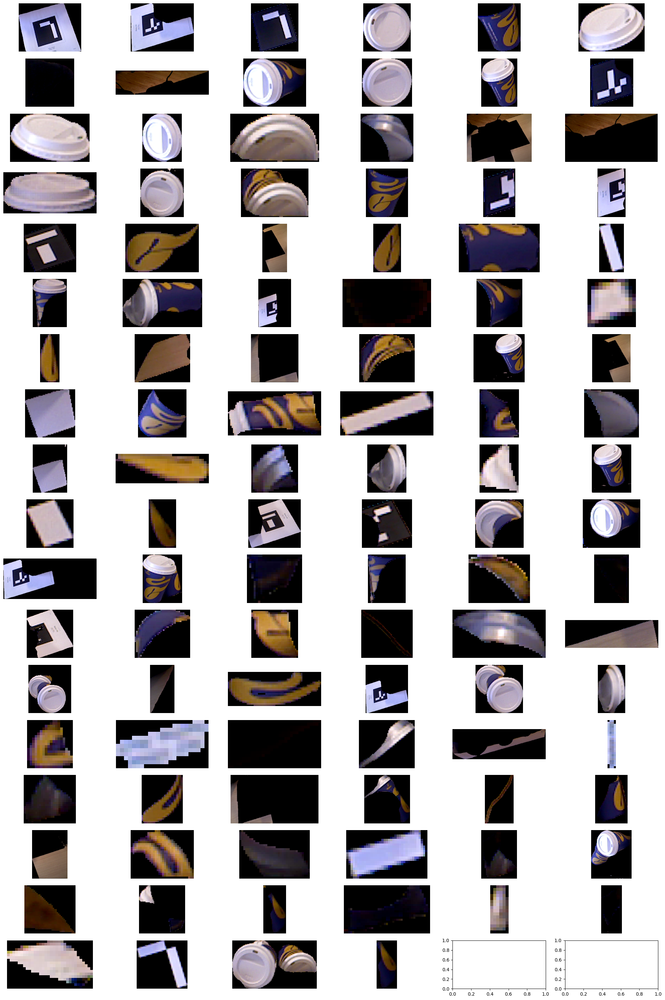

In [ ]:
# # Visualize proposals
# import matplotlib.pyplot as plt
# from math import ceil
# def plot_images(images, rows, cols):
#     fig, axes = plt.subplots(rows, cols, figsize=(20, 30))
#     for i, ax in enumerate(axes.flat):
#         if i >= len(images):
#             break
#         ax.imshow(images[i])
#         ax.axis('off')
#     plt.tight_layout()
#     plt.show()

# # Define the number of rows and columns in the grid
# rows = ceil(len(masked_images) / 6)
# cols = 6
# # Plot the masked_images array in a grid
# plot_images(masked_images, rows, cols) 

In [ ]:
import os

# Choose crop 4 it is in object id 12
crop_idx = 79 # 125, 102 for background; 131 for foreground
obj_id = 1
crop1 = {
    "crop" : masked_images[crop_idx], # it is saved as Image so crop1["crop"] to visualize it
    "masks" : sam_detections["masks"][crop_idx],
    "boxes" : sam_detections["boxes"][crop_idx]
}

# Save image
if not os.path.exists(f"foundpose_analysis/{dataset}"):
    os.makedirs(f"foundpose_analysis/{dataset}")
crop1["crop"].save(f"foundpose_analysis/{dataset}/crop1.png")
crop1["crop"]

In [ ]:
from src.model.custom_cnos import check_similarity, check_similarity_2


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
best_model_path = "contrastive_learning/saved_checkpoints/best_model_checkpoint.pth"
crop_path = f"foundpose_analysis/{dataset}/crop1.png"
crop_rgb = np.transpose(np.array(Image.open(crop_path).convert("RGB"))[:,:,:3]/255.0, (2,0,1)) # (124, 157, 3)

# Test model
check_similarity_2(best_model_path=best_model_path, crop_rgb=crop_rgb, templates=syn_templates, device=device)
# see the results lb it is quite inconsitent- it means we lack data augmentation and also the dataset needs to be expanded for more cases for postive pairs

Using cache found in /home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main


Prediction of index161 is: tensor([2.4569, 2.5132, 2.5592, 2.4952, 2.5529, 2.5325, 2.5073, 2.5043, 2.5899,
        2.5093]), 2.5220718383789062 as 0


0

In [ ]:
Image.open(crop_path).convert("RGB")

## 3.2 Try out idea with Clip

In [ ]:
from torchvision.transforms import Compose, ToTensor, Normalize

def _convert_image_to_rgb(image):
    return image.convert("RGB")


def _transform(n_px):
    return Compose([
        # Resize(n_px, interpolation=BICUBIC),
        # CenterCrop(n_px),
        # _convert_image_to_rgb,
        ToTensor(),
        Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
    ])

process = _transform(224)


In [ ]:
from src.model.constrastive_learning import resize_and_pad_image

resized_masked_images = [Image.fromarray(np.array(resize_and_pad_image(np.transpose(np.array(masked_image), (2,0,1)), target_max=224).permute(1,2,0))) for masked_image in masked_images], # resize and pad images

In [ ]:
import torch
import clip
from PIL import Image

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)


# stacked_masked_images = torch.stack([preprocess(img).to(device) for img in masked_images])
stacked_masked_images = torch.stack([process(img).to(device) for img in resized_masked_images[0]]) # Resize to 224 beforehand already
text = clip.tokenize(["not a cup", "the rest"]).to(device)

with torch.no_grad():
    image_features = model.encode_image(stacked_masked_images)
    text_features = model.encode_text(text)
    
    logits_per_image, logits_per_text = model(stacked_masked_images, text)
    probs = logits_per_image.softmax(dim=-1).cpu().numpy()

pred = np.argmax(probs, axis=1)
prob_max = np.max(probs, axis=1)
idx_selected = list(np.where(pred == 0)[0])
selected_prob_max = prob_max[idx_selected]
print(len(idx_selected))

80


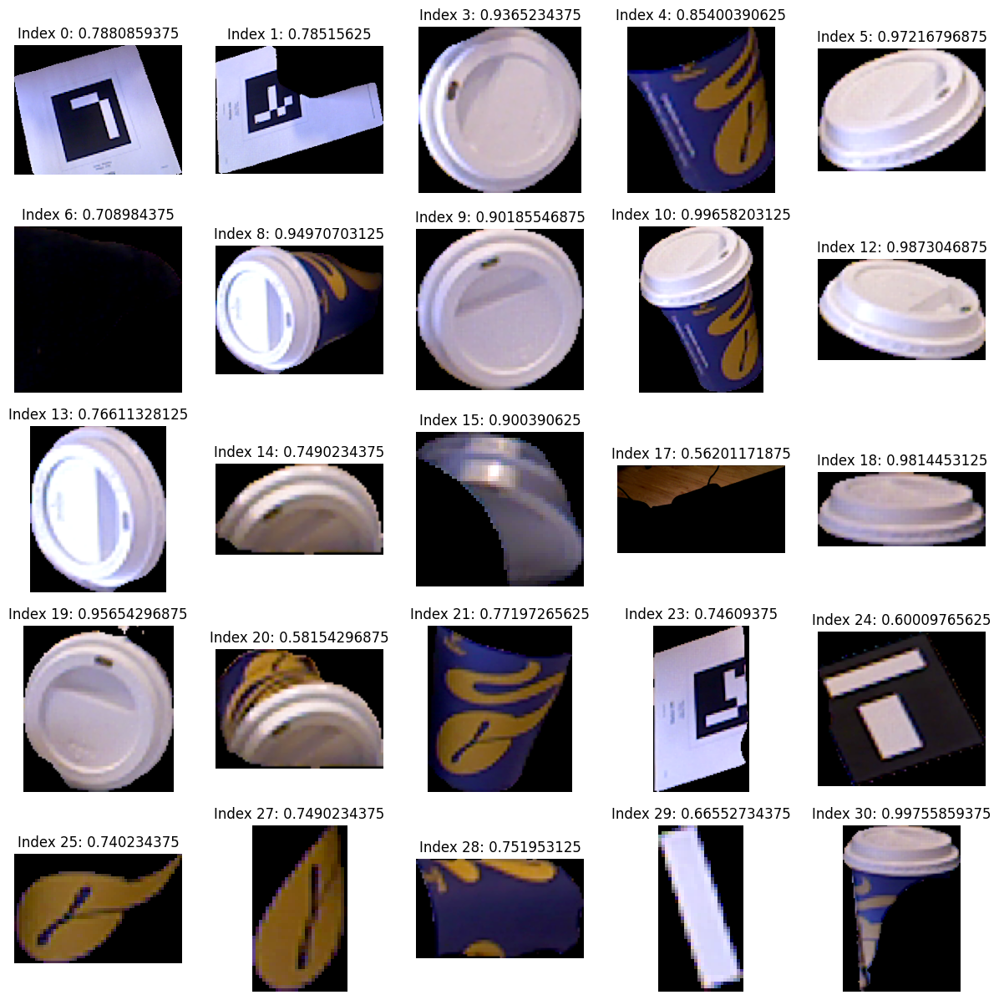

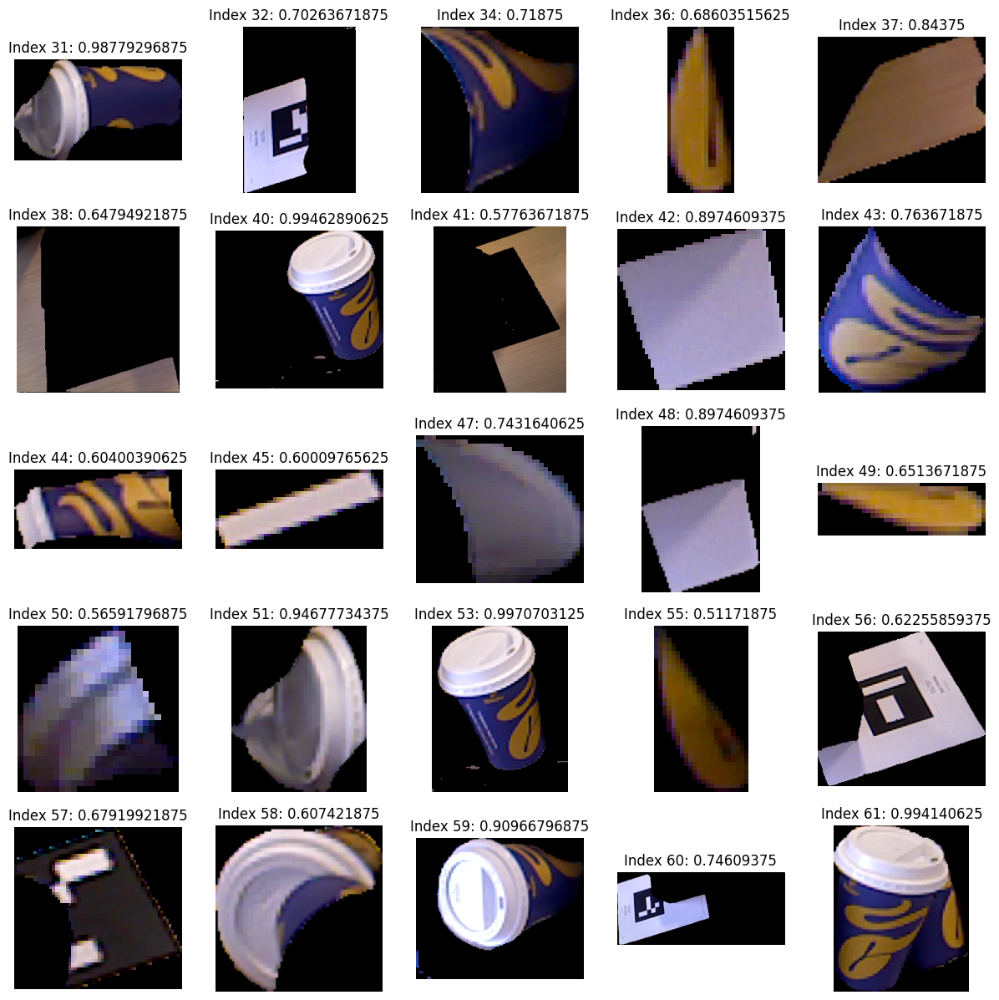

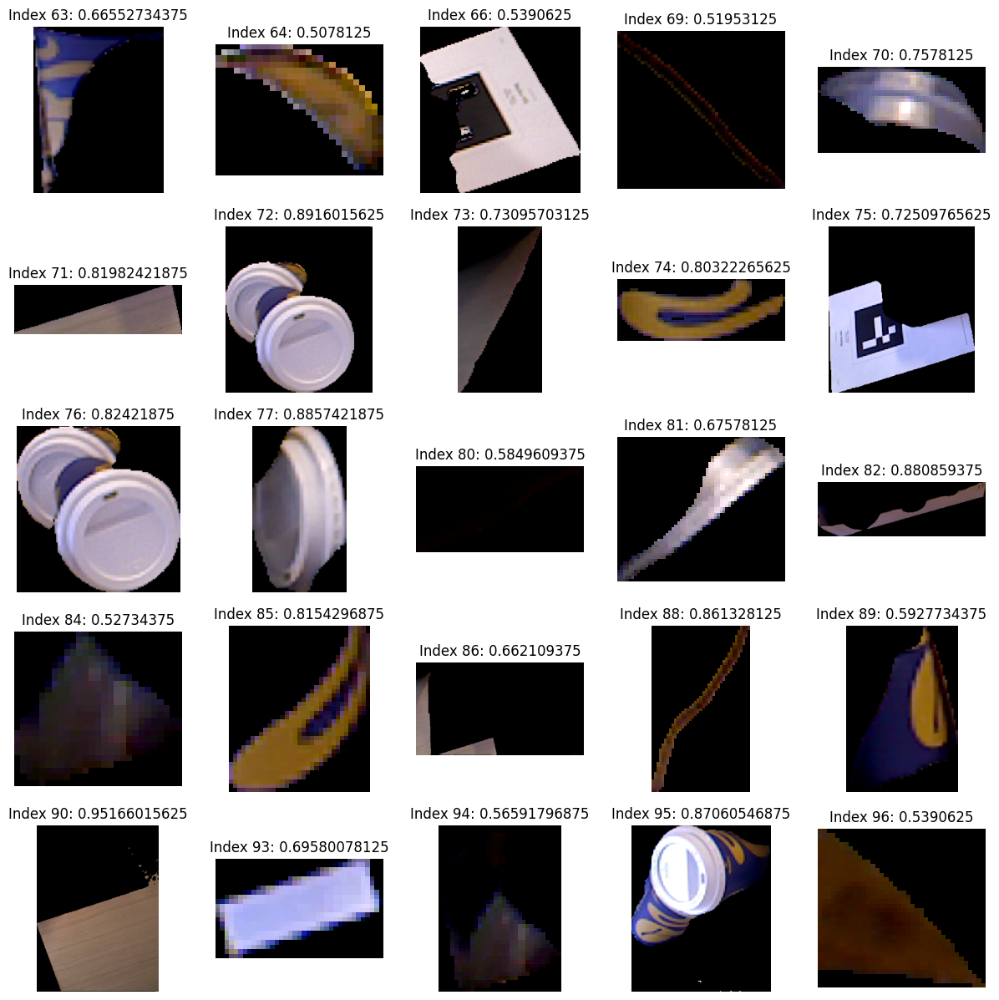

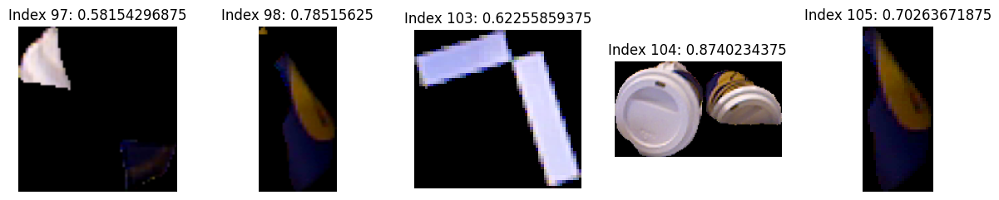

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Number of images to display at a time
images_per_page = 25

# Define the number of rows and columns for the grid
rows = 5
cols = 5

# Iterate over the indices in idx_selected_proposals in steps of images_per_page
for i in range(0, len(idx_selected), images_per_page):
    # Create a new figure for each set of images
    plt.figure(figsize=(15, 15))

    for j in range(images_per_page):
        # Calculate the current index in idx_selected_proposals
        current_index = i + j

        # Check if the current index is within the bounds of idx_selected_proposals
        if current_index >= len(idx_selected):
            break

        # Get the image index from idx_selected_proposals
        image_index = idx_selected[current_index]
        image_prob = selected_prob_max[current_index]

        # Add a subplot for the current image
        plt.subplot(rows, cols, j + 1)
        plt.imshow(np.array(masked_images[image_index]))
        plt.title(f"Index {image_index}: {image_prob}")
        plt.axis('off')

    # Display the figure containing the images
    plt.show()


In [ ]:
# Only choose crops with probability > 0.8
idx_selected_proposals = [idx_selected[i] for i in range(len(idx_selected)) if selected_prob_max[i]>0.8 ]

In [ ]:
# from src.model.custom_cnos import check_similarity, check_similarity_2

# masked_images_idx = 3
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# best_model_path = "contrastive_learning/saved_checkpoints/best_model_checkpoint_bce_seperate_model.pth"
# crop_path = "cnos_analysis/crop_proposals/crop1.png"
# crop_rgb = np.transpose(np.array(masked_images[masked_images_idx])[:,:,:3]/255.0, (2,0,1)) # (124, 157, 3)

# check_similarity_2(best_model_path=best_model_path, crop_rgb=crop_rgb, templates=syn_templates, device=device)
# # see the results lb it is quite inconsitent- it means we lack data augmentation and also the dataset needs to be expanded for more cases for postive pairs

In [ ]:
len(idx_selected_proposals)

31